# Analisis exploratorio de los datos de precipitaciones

- Datos obtenidos a traves del Notebook WebScraping
- Fuente de datos: https://www.ncei.noaa.gov/access/monitoring/climate-at-a-glance/statewide/time-series

In [1]:
#--BASE--#
import pandas as pd
import seaborn as sns
import warnings
import numpy as np
import datetime
import os
import datetime 

#--VISUALIZACIÓN--#
import matplotlib as mpl
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff

#--CONFIGURACIÓN--#
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.3f}'.format
warnings.filterwarnings('ignore')

## 1. Carga de Datos

In [2]:
#Carga del documento csv con los datos de clima

df = pd.read_csv("../DATOS/Clima/TOTAL_STATES_PP.csv")


In [3]:
df.head()

,State,date,Months,Precipitation
0,Idaho,1950,January,121.920
1,Idaho,1951,January,79.502
2,Idaho,1952,January,77.470
3,Idaho,1953,January,143.002
4,Idaho,1954,January,108.204


In [4]:
df['Precipitation'].mean()

78.25889630574483

In [5]:
lineal_regresión = pd.pivot_table(df, index = 'date', values = 'Precipitation', columns='State', aggfunc=np.mean)
px.line(lineal_regresión)

## 2. Análisis de variación en las precipitaciones
### 2.1. Análisis Global
- En este primer análisis lo que se busca es tener una idea los valores de precipitaciones y sus variaciones a lo largo de los años para cada estado. Para el calculo de la precipitación media en cada estado se ha realizado un calculo de medias de todos los años y todos los meses, representandose graficamente.

In [6]:
# Precipitación media de todos los meses y todos los años para cada estado

df_mean = df.groupby(['State']).mean()
df_mean.head()

,date,Precipitation
State,,
Alabama,1985.500,118.761
Alaska,1985.500,77.340
Arizona,1985.500,25.583
Arkansas,1985.500,107.962
California,1985.500,47.086


In [7]:
#se ordenan los valores de mayor a menos

df_mean.sort_values(by = 'Precipitation', ascending = False, inplace = True)

In [8]:
#representación de los estados por valor medio de precipitaciones de mayor a menor

fig = px.bar(df_mean, y = 'Precipitation', title = 'Precipitación media de cada estado entre 1950 hasta 2021')
fig.show()

### 2.2 Evolución media anual por estados
En este caso se estudia cual ha sido la evolución de las precipitaciones a lo largo de los años para cada estado. Para ello se ha representado la media de los meses para cada año y finalmente la linea de tendencia para conocer si realmente existe un incremento de precipitaciones; todo esto se ha hecho para cada uno de los estados de EEUU.

In [9]:
#Se crea una nueva variable igual que a "df_concat", se elimina la columna "Months" y se agrupa por estado y fecha

df_sate = df.copy()
df_sate.drop(['Months'], axis = 1, inplace = True)
df_sate = df_sate.groupby(['State', 'date']).mean()
df_sate.head()

Precipitation
State   date               
Alabama 1950        112.268
        1951        112.014
        1952         98.848
        1953        125.836
        1954         74.930

In [10]:
#Se elimina el indice agregado

df_sate = df_sate.reset_index()

In [11]:
#Representación gráfica de la evolución anual para las precipitaciones en cada estado

fig= px.scatter(df_sate, 
                x = 'date', 
                y='Precipitation', 
                color = 'State', 
                opacity=1, 
                trendline='ols', 
                title = 'Evolución anual de la Precipitación en cada estado desde 1950 hasta 2021')
fig.show()

### 2.3. Evolución de la tendencia anual en EEUU

In [12]:
#Media de todos los meses y estados agrupandolos por meses

df_prove_total = df.copy()
df_prove_total.drop('State', axis = 1, inplace = True)
df_prove_total= df_prove_total.groupby('date').mean()

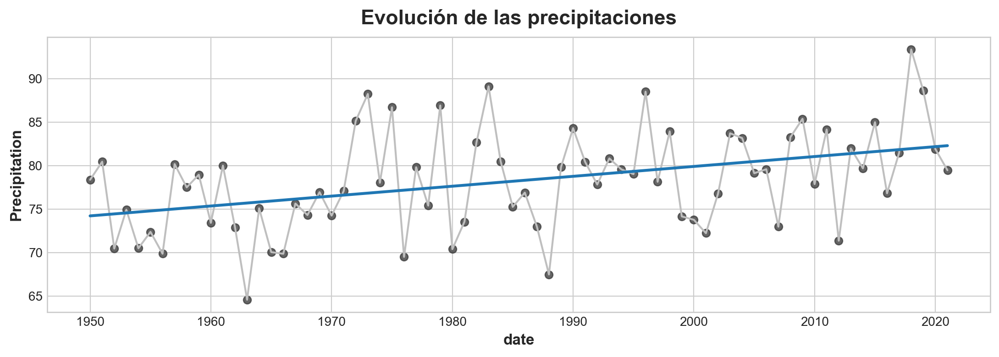

In [13]:
#Representación grárfica de la evolució de PP para cada año en EEUU

#fig = px.line(df_prove_total, y = 'retorno')
#fig= px.scatter(df_prove_total, y='Precipitation', opacity=1, trendline='ols', trendline_scope='overall')
#fig.show()

x = pd.DataFrame(df.groupby('date')['Precipitation'].mean())

plt.style.use("seaborn-whitegrid")
plt.rc("figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold')
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

fig, ax = plt.subplots()
ax.plot(x.index, 'Precipitation', data=x, color='0.75')
ax = sns.regplot(x=x.index, y='Precipitation', data=x, ci=None, scatter_kws=dict(color='0.25'))
ax.set_title('Evolución de las precipitaciones');

### 2.4.1 Visualización de la precipitación por estaciones para cada año

Con el fin de analizar más profundamente la evolución anual de precipitaciones y no crear una gran cantidad de gráficas que pueden llegar incluso a confundir, se decide por dividir el analisis en estaciones climáticas. Para ello se han creado cuatro DataFrames, uno por cada estación del año, en el que incluyen las precipitaciones en función de los estados, años y meses que hacen referencia a cada estación.

In [14]:
df_prove_1 = df.copy()
df_prove_1 = df_prove_1.set_index('Months')
df_prove_1

,State,date,Precipitation
Months,,,
January,Idaho,1950,121.920
January,Idaho,1951,79.502
January,Idaho,1952,77.470
January,Idaho,1953,143.002
January,Idaho,1954,108.204
...,...,...,...
December,Georgia,2017,81.026
December,Georgia,2018,244.602
December,Georgia,2019,166.116


In [15]:
df_verano = df_prove_1.loc[['June', 'July', 'August']].reset_index()
df_primavera = df_prove_1.loc[['March', 'April', 'May']].reset_index()
df_otoño = df_prove_1.loc[['September', 'October', 'November']].reset_index()
df_invierno = df_prove_1.loc[['December', 'January', 'February']].reset_index()

In [16]:
df_verano

,Months,State,date,Precipitation
0,June,Idaho,1950,52.832
1,June,Idaho,1951,28.448
2,June,Idaho,1952,62.230
3,June,Idaho,1953,50.546
4,June,Idaho,1954,69.596
...,...,...,...,...
10579,August,Georgia,2017,116.332
10580,August,Georgia,2018,140.716
10581,August,Georgia,2019,115.062
10582,August,Georgia,2020,175.514


In [17]:
fig= px.scatter(df_verano, 
                x = 'date', 
                y='Precipitation', 
                color = 'State', 
                opacity=1, 
                trendline='ols', 
                title = 'Evolución anual de la Precipitación en verano desde 1950 hasta 2021')
fig.show()

In [18]:
fig= px.scatter(df_primavera, 
                x = 'date', 
                y='Precipitation', 
                color = 'State', 
                opacity=1, 
                trendline='ols', 
                title = 'Evolución anual de la Precipitación en primavera desde 1950 hasta 2021')
fig.show()

In [19]:
fig= px.scatter(df_invierno, 
                x = 'date', 
                y='Precipitation', 
                color = 'State', 
                opacity=1, 
                trendline='ols', 
                title = 'Evolución anual de la Precipitación en invierno desde 1950 hasta 2021')
fig.show()

In [20]:
fig= px.scatter(df_otoño, 
                x = 'date', 
                y='Precipitation', 
                color = 'State', 
                opacity=1, 
                trendline='ols', 
                title = 'Evolución anual de la Precipitación en otoño desde 1950 hasta 2021')
fig.show()

### 2.4.2 Visualización de la precipitación por estaciones para cada estado


In [21]:
#Se saca la media de cada estación clímatica para cada estado

df_verano_1 = df_verano.groupby(['State']).mean()
df_primavera_1 = df_primavera.groupby(['State']).mean()
df_otoño_1 = df_otoño.groupby(['State']).mean()
df_invierno_1 = df_invierno.groupby(['State']).mean()

In [22]:
#Se ordenan los datos por orden descendente

df_verano_1 = df_verano_1.sort_values(by  = 'Precipitation', ascending = False)
df_primavera_1 = df_primavera_1.sort_values(by  = 'Precipitation', ascending = False)
df_otoño_1 = df_otoño_1.sort_values(by  = 'Precipitation', ascending = False)
df_invierno_1 = df_invierno_1.sort_values(by  = 'Precipitation', ascending = False)

In [23]:
#Representación grafica de la temperatura media para cada estado en el periodo de verano

fig = px.bar(df_verano_1, y = 'Precipitation', title = 'Precipitación media en en verano')
fig.show() 

In [24]:
#Representación grafica de la temperatura media para cada estado en el periodo de primavera

fig = px.bar(df_primavera_1, y = 'Precipitation', title = 'Precipitación media en primavera')
fig.show() 

In [25]:
#Representación grafica de la temperatura media para cada estado en el periodo de otoño

fig = px.bar(df_otoño_1, y = 'Precipitation', title = 'Precipitación media en otoño')
fig.show() 

In [26]:
#Representación grafica de la temperatura media para cada estado en el periodo de invierno

fig = px.bar(df_invierno_1, y = 'Precipitation', title = 'Precipitación media en invierno')
fig.show() 

### 2.5. Analisis de precipitación diferenciando entre mes, año y estado

In [27]:
#Precipitaciones mínima y maxima de toda la serie

print(f"Precipitación minima: {df['Precipitation'].min()}")
print(f"Precipitación maxima {df['Precipitation'].max():.2f}")
print(f"Precipitación media {df['Precipitation'].mean():.2f}")

Precipitación minima: 0.0
Precipitación maxima 404.37
Precipitación media 78.26


In [28]:
#Evolución de las `precipitaciones para cada mes, estado y año

df0 = df.copy()
df0.set_index("Months", inplace=True)
df0 = df0.loc[['January', 'February', 'March', 'April', 'May', 'June', 'July','August', 'September', 'October', 'November', 'December' ]]
df0.reset_index(inplace = True)

fig = px.line_polar(df0, r=df0.Precipitation, theta=df0.Months, animation_frame= 'date', line_close=True ,color="State")
fig.update_layout(polar=dict(radialaxis=dict(visible=True, range=[0, 410])),
                  autosize=False,
                  width=1000,
                  height=600,
                  margin=dict(l=50, r=50, b=100, t=100, pad=4), template='seaborn', paper_bgcolor="rgb(234, 234, 242)",
                  legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1))
fig.show()
#reference: https://plotly.com/python/polar-chart/

### 2.6 Evolución de temperatura por año y estado representado en el mapa de EEUU

Para esta representación se ha utilizado un mapa cloropletico de estados unidos a partir de la función de plotly: "choropleth", esta función clasifica a los estados con las abreviaturas por lo que es se crea un diccionario para incorporar las abrebiaturas al dataframe.

### Mapa

In [29]:
#Creación de un diccionario con los codigos de cada estado

columns = {
    'AL':'Alabama',      'AK':'Alaska',       'AZ':'Arizona',
    'AR':'Arkansas',     'CA':'California',   'CO':'Colorado',
    'CT':'Connecticut',  'DE':'Delaware',     'FL':'Florida',
    'GA':'Georgia',      'ID':'Idaho',        'IL':'Illinois',
    'IN':'Indiana',      'IA':'Iowa',         'KS':'Kansas',
    'KY':'Kentucky',     'LA':'Louisiana',    'ME':'Maine',
    'MD':'Maryland',     'MA':'Massachusetts','MI':'Michigan',
    'MN':'Minnesota',    'MS':'Mississippi',  'MO':'Missouri',
    'MT':'Montana',      'NE':'Nebraska',     'NV':'Nevada',
    'NH':'New_Hampshire','NJ':'New_Jersey',   'NM':'New_Mexico',
    'NY':'New_York',     'NC':'North_Carolina','ND':'North_Dakota',
    'OH':'Ohio',         'OK':'Oklahoma',     'OR':'Oregon',
    'PA':'Pennsylvania', 'RI':'Rhode_Island', 'SC':'South_Carolina',
    'SD':'South_Dakota', 'TN':'Tennessee',    'TX':'Texas',
    'UT':'Utah',         'VT':'Vermont',      'VA':'Virginia',
    'WA':'Washington',   'WV':'West_Virginia','WI':'Wisconsin',
    'WY':'Wyoming'
}


In [30]:
#se crea un dataframe a partir del diccionario

df_code_states = pd.DataFrame([[key, columns[key]] for key in columns.keys()], columns=['code', 'state'])
df_code_states.head()

,code,state
0,AL,Alabama
1,AK,Alaska
2,AZ,Arizona
3,AR,Arkansas
4,CA,California


In [31]:
#Se integran los codigos en el dataframe

df_map = df.copy()
df_map = df_map.merge(df_code_states, left_on = 'State', right_on='state')
df_map.drop('state', axis = 1, inplace = True)

In [32]:
df_map

,State,date,Months,Precipitation,code
0,Idaho,1950,January,121.920,ID
1,Idaho,1951,January,79.502,ID
2,Idaho,1952,January,77.470,ID
3,Idaho,1953,January,143.002,ID
4,Idaho,1954,January,108.204,ID
...,...,...,...,...,...
42331,Georgia,2017,December,81.026,GA
42332,Georgia,2018,December,244.602,GA
42333,Georgia,2019,December,166.116,GA
42334,Georgia,2020,December,78.740,GA


In [33]:
#se comprueba que no haya ningun error

df_map.isnull().sum()

State            0
date             0
Months           0
Precipitation    0
code             0
dtype: int64

In [34]:
## Hay que cambiar los colores y rangos
#Representación del mapa de EEUU y la evolución de la temperatura para cada estado a lo largo del rango de años

fig = px.choropleth(df_map, locations="code", # used plotly express choropleth for animation plot
                    locationmode= "USA-states",
                    color="Precipitation", 
                    color_continuous_scale=px.colors.diverging.BrBG,
                    hover_name="State",
                    scope="usa",
                    hover_data=['Precipitation'],
                    animation_frame =df_map.date,
                    labels={'Precipitation':'Precipitation', 'Precipitation':'Precipitation'},
                    title = 'Precipitation Change - 1950 - 2021')
fig.update_layout(height=600)
fig.show()

#reference: https://plotly.com/python/choropleth-maps/